<a href="https://colab.research.google.com/github/TomekSzymanski/Kaggle/blob/master/CIFAR_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Your first CNN on CIFAR-10

In this task you will: 
* define your first CNN architecture for CIFAR-10 dataset
* train it from scratch
* visualize learnt filters

CIFAR-10 dataset contains 32x32 color images from 10 classes: __airplane, automobile, bird, cat, deer, dog, frog, horse, ship, truck__:
<img src="images/cifar10.jpg" style="width:80%">

In [1]:
import tensorflow as tf
import keras
from keras import backend as K

!pip install -q -U tensorflow-addons

import tensorflow_addons as tfa
%load_ext tensorboard

import datetime, os
import numpy as np
%matplotlib inline



import matplotlib.pyplot as plt
print(tf.__version__)
print(keras.__version__)

     |████████████████████████████████| 1.1 MB 5.2 MB/s 
2.7.0
2.7.0


# Load dataset

170508288/170498071 [==============================] - 8s 0us/step
Train samples: (50000, 32, 32, 3) (50000, 1)
Test samples: (10000, 32, 32, 3) (10000, 1)


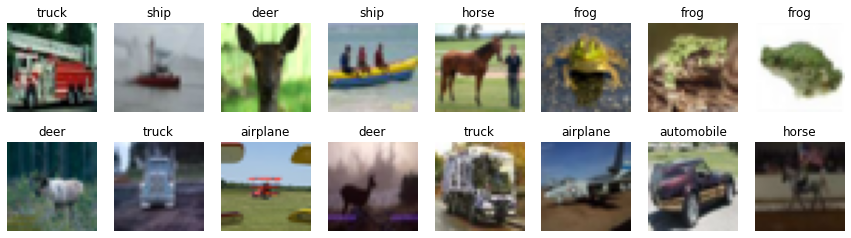

In [2]:
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

print("Train samples:", x_train.shape, y_train.shape)
print("Test samples:", x_test.shape, y_test.shape)

NUM_CLASSES = 10
cifar10_classes = ["airplane", "automobile", "bird", "cat", "deer", 
                   "dog", "frog", "horse", "ship", "truck"]

# show random images from train
cols = 8
rows = 2
fig = plt.figure(figsize=(2 * cols - 1, 2.5 * rows - 1))
for i in range(cols):
    for j in range(rows):
        random_index = np.random.randint(0, len(y_train))
        ax = fig.add_subplot(rows, cols, i * rows + j + 1)
        ax.grid('off')
        ax.axis('off')
        ax.imshow(x_train[random_index, :])
        ax.set_title(cifar10_classes[y_train[random_index, 0]])
plt.show()

# Data preparation

In [3]:
# normalize inputs
x_train2 = x_train / 255 - 0.5
x_test2 = x_test / 255 - 0.5

# convert class labels to one-hot encoded, should have shape (?, NUM_CLASSES)
y_train2 = tf.keras.utils.to_categorical(y_train, NUM_CLASSES)
y_test2 = tf.keras.utils.to_categorical(y_test, NUM_CLASSES)

# Baseline model

In [4]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization
from keras.layers.advanced_activations import LeakyReLU

m = Sequential()

m.add(Conv2D(filters=16, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Flatten())

m.add(Dense(256))
m.add(LeakyReLU(0.1))
m.add(Dropout(0.5))
m.add(Dense(NUM_CLASSES))
m.add(Activation("softmax"))

m.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 16)        448       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 16)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 32)        4640      
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 32, 32, 32)        0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 16, 16, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 16, 16, 32)        0         
                                                        

In [5]:
INIT_LR = 5e-3  # initial learning rate
BATCH_SIZE = 32

m.compile(
    loss='categorical_crossentropy',  # we train 10-way classification
    optimizer=tf.keras.optimizers.Adamax(learning_rate=INIT_LR), 
    metrics=['accuracy']
)

In [6]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [7]:
# scheduler of learning rate (decay with epochs)
def lr_scheduler(epoch):
    return INIT_LR * 0.9 ** epoch

# callback for printing of actual learning rate used by optimizer
class LrHistory(keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs={}):
        print("Learning rate:", K.get_value(m.optimizer.lr))

early_stopping = tf.keras.callbacks.EarlyStopping(
    min_delta=0,
    patience=2
)

logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

In [8]:
m.fit(
    x_train2, y_train2,  # prepared data
    batch_size=BATCH_SIZE,
    epochs=40,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), LrHistory(), tfa.callbacks.TQDMProgressBar(), early_stopping, tensorboard_callback],
    validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0
)

Training:   0%|           0/40 ETA: ?s,  ?epochs/s

Learning rate: 0.005
Epoch 1/40


0/1563           ETA: ?s - 

Learning rate: 0.0045
Epoch 2/40


0/1563           ETA: ?s - 

Learning rate: 0.00405
Epoch 3/40


0/1563           ETA: ?s - 

Learning rate: 0.003645
Epoch 4/40


0/1563           ETA: ?s - 

Learning rate: 0.0032805
Epoch 5/40


0/1563           ETA: ?s - 

Learning rate: 0.00295245
Epoch 6/40


0/1563           ETA: ?s - 

Learning rate: 0.002657205
Epoch 7/40


0/1563           ETA: ?s - 

Learning rate: 0.0023914846
Epoch 8/40


0/1563           ETA: ?s - 

Learning rate: 0.002152336
Epoch 9/40


0/1563           ETA: ?s - 

Learning rate: 0.0019371024
Epoch 10/40


0/1563           ETA: ?s - 

Learning rate: 0.0017433922
Epoch 11/40


0/1563           ETA: ?s - 

Learning rate: 0.0015690529
Epoch 12/40


0/1563           ETA: ?s - 

Learning rate: 0.0014121477
Epoch 13/40


0/1563           ETA: ?s - 

Learning rate: 0.001270933
Epoch 14/40


0/1563           ETA: ?s - 

Learning rate: 0.0011438397
Epoch 15/40


0/1563           ETA: ?s - 

Learning rate: 0.0010294557
Epoch 16/40


0/1563           ETA: ?s - 

# Evaluate baseline model

In [9]:
# make test predictions
y_pred_test = m.predict(x_test2)
y_pred_test_classes = np.argmax(y_pred_test, axis=1)
y_pred_test_max_probas = np.max(y_pred_test, axis=1)

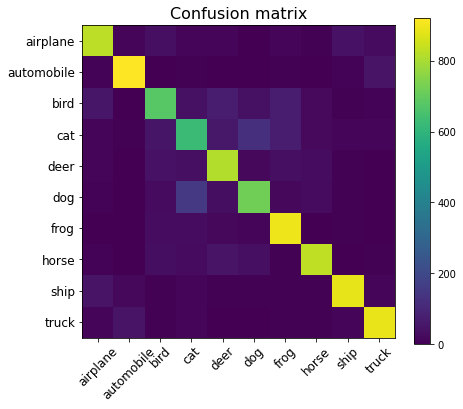

Test accuracy: 0.8087


In [10]:
# confusion matrix and accuracy
from sklearn.metrics import confusion_matrix, accuracy_score
plt.figure(figsize=(7, 6))
plt.title('Confusion matrix', fontsize=16)
plt.imshow(confusion_matrix(y_test, y_pred_test_classes))
plt.xticks(np.arange(10), cifar10_classes, rotation=45, fontsize=12)
plt.yticks(np.arange(10), cifar10_classes, fontsize=12)
plt.colorbar()
plt.show()
print("Test accuracy:", accuracy_score(y_test, y_pred_test_classes))

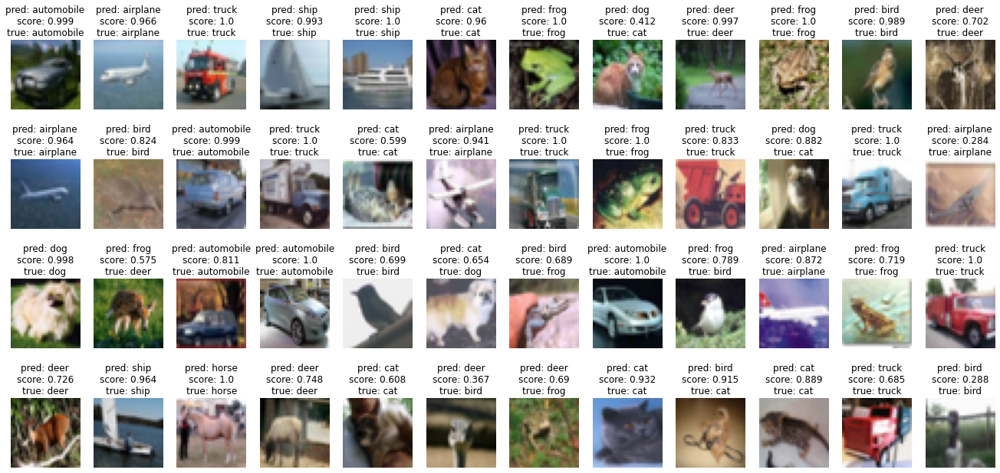

In [11]:
# inspect preditions
cols = 12
rows = 4
fig = plt.figure(figsize=(2 * cols - 1, 3 * rows - 1))
for i in range(cols):
    for j in range(rows):
        random_index = np.random.randint(0, len(y_test))
        ax = fig.add_subplot(rows, cols, i * rows + j + 1)
        ax.grid('off')
        ax.axis('off')
        ax.imshow(x_test[random_index, :])
        pred_label = cifar10_classes[y_pred_test_classes[random_index]]
        pred_proba = y_pred_test_max_probas[random_index]
        true_label = cifar10_classes[y_test[random_index, 0]]
        ax.set_title("pred: {}\nscore: {:.3}\ntrue: {}".format(
               pred_label, pred_proba, true_label
        ))
plt.show()

# Optimisations

## One more dense layer

In [ ]:
m = Sequential()

m.add(Conv2D(filters=16, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Flatten())

m.add(Dense(256))
m.add(LeakyReLU(0.1))
m.add(Dropout(0.5))

m.add(Dense(256))
m.add(LeakyReLU(0.1))
m.add(Dropout(0.5))

m.add(Dense(NUM_CLASSES))
m.add(Activation("softmax"))

m.summary()

m.compile(
    loss='categorical_crossentropy',  # we train 10-way classification
    optimizer=tf.keras.optimizers.Adamax(learning_rate=INIT_LR), 
    metrics=['accuracy']
)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 32, 32, 16)        448       
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 32, 32, 16)        0         
                                                                 
 conv2d_5 (Conv2D)           (None, 32, 32, 32)        4640      
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 32, 32, 32)        0         
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 16, 16, 32)       0         
 2D)                                                             
                                                                 
 dropout_3 (Dropout)         (None, 16, 16, 32)        0         
                                                      

In [ ]:
m.fit(
    x_train2, y_train2,  # prepared data
    batch_size=BATCH_SIZE,
    epochs=40,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), LrHistory(), tfa.callbacks.TQDMProgressBar(), early_stopping, tensorboard_callback],
    validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0
)

Training:   0%|           0/40 ETA: ?s,  ?epochs/s

Learning rate: 0.005
Epoch 1/40


0/1563           ETA: ?s - 

Learning rate: 0.0045
Epoch 2/40


0/1563           ETA: ?s - 

Learning rate: 0.00405
Epoch 3/40


0/1563           ETA: ?s - 

Learning rate: 0.003645
Epoch 4/40


0/1563           ETA: ?s - 

Learning rate: 0.0032805
Epoch 5/40


0/1563           ETA: ?s - 

Learning rate: 0.00295245
Epoch 6/40


0/1563           ETA: ?s - 

Learning rate: 0.002657205
Epoch 7/40


0/1563           ETA: ?s - 

Learning rate: 0.0023914846
Epoch 8/40


0/1563           ETA: ?s - 

Learning rate: 0.002152336
Epoch 9/40


0/1563           ETA: ?s - 

Learning rate: 0.0019371024
Epoch 10/40


0/1563           ETA: ?s - 

Learning rate: 0.0017433922
Epoch 11/40


0/1563           ETA: ?s - 

Accuracy not better

## One more VGG block 

One so called VGG block contains: conv 3x3, conv 3x3, maxpool 2x2.

Also in the third VGG block we will use 2 times number of neurons as in previous one.

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout
from keras.layers.advanced_activations import LeakyReLU

m = Sequential()

m.add(Conv2D(filters=16, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Flatten())

m.add(Dense(256))
m.add(LeakyReLU(0.1))
m.add(Dropout(0.5))
m.add(Dense(NUM_CLASSES))
m.add(Activation("softmax"))

m.summary()

m.compile(
    loss='categorical_crossentropy',  # we train 10-way classification
    optimizer=tf.keras.optimizers.Adamax(learning_rate=INIT_LR), 
    metrics=['accuracy']
)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 32, 32, 16)        448       
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 32, 32, 16)        0         
                                                                 
 conv2d_5 (Conv2D)           (None, 32, 32, 32)        4640      
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 32, 32, 32)        0         
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 16, 16, 32)       0         
 2D)                                                             
                                                                 
 dropout_3 (Dropout)         (None, 16, 16, 32)        0         
                                                      

In [ ]:
m.fit(
    x_train2, y_train2,
    batch_size=BATCH_SIZE,
    epochs=40,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), LrHistory(), tfa.callbacks.TQDMProgressBar(), early_stopping, tensorboard_callback],
    validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0
)

Training:   0%|           0/40 ETA: ?s,  ?epochs/s

Learning rate: 0.005
Epoch 1/40


0/1563           ETA: ?s - 

Learning rate: 0.005
Epoch 2/40


0/1563           ETA: ?s - 

Learning rate: 0.005
Epoch 3/40


0/1563           ETA: ?s - 

Learning rate: 0.005
Epoch 4/40


0/1563           ETA: ?s - 

Learning rate: 0.005
Epoch 5/40


0/1563           ETA: ?s - 

Learning rate: 0.005
Epoch 6/40


0/1563           ETA: ?s - 

Learning rate: 0.005
Epoch 7/40


0/1563           ETA: ?s - 

Learning rate: 0.005
Epoch 8/40


0/1563           ETA: ?s - 

Learning rate: 0.005
Epoch 9/40


0/1563           ETA: ?s - 

Learning rate: 0.005
Epoch 10/40


0/1563           ETA: ?s - 

Learning rate: 0.005
Epoch 11/40


0/1563           ETA: ?s - 

Learning rate: 0.005
Epoch 12/40


0/1563           ETA: ?s - 

Learning rate: 0.005
Epoch 13/40


0/1563           ETA: ?s - 

Learning rate: 0.005
Epoch 14/40


0/1563           ETA: ?s - 

No success so far...

## Data augmentation

First let's explore the dataset to see which augmentations are valid in this domain

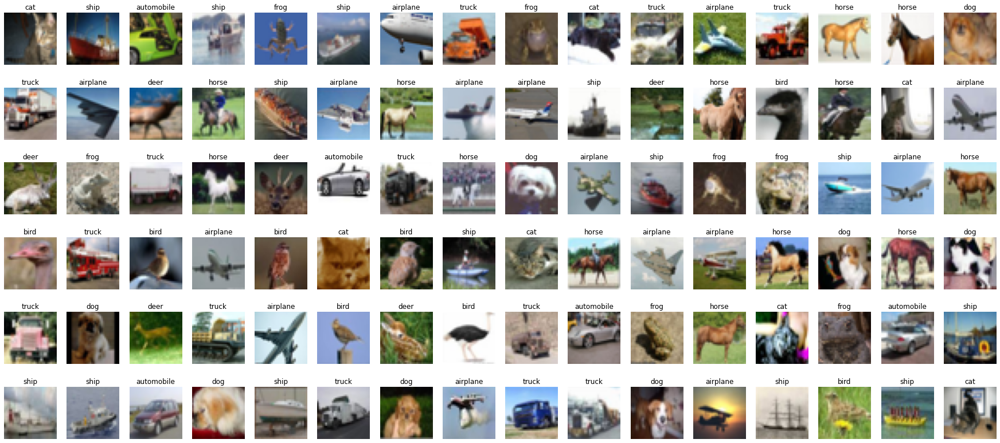

In [ ]:
# show random images from train
cols = 16
rows = 6
fig = plt.figure(figsize=(2 * cols - 1, 2.5 * rows - 1))
for i in range(cols):
    for j in range(rows):
        random_index = np.random.randint(0, len(y_train))
        ax = fig.add_subplot(rows, cols, i * rows + j + 1)
        ax.grid('off')
        ax.axis('off')
        ax.imshow(x_train[random_index, :])
        ax.set_title(cifar10_classes[y_train[random_index, 0]])
plt.show()

We can see that:
- images are taken from both left and right perspective, incl. from angle perspective: horizontal flip applies.
- __TODO__ could we also do something like rotation around horizontal axis (imgaug library?) - let's use some shear in this place
- very many images are zoomed, many zoomed too much. Additional zooming in will help
- while the resolution is generally quite low, for many it is too low - adding blur or similar should help (more jpg compression for example)
- sometimes images are rotated but not much - add some small rotation
- some horizontal and vertical shift is applicable


But, first, are the classes more or less balanced?

In [ ]:
np.unique(y_train, return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=uint8),
 array([5000, 5000, 5000, 5000, 5000, 5000, 5000, 5000, 5000, 5000]))

Well, very balanced:)

Baseline model with data augmentation

In [ ]:
m = Sequential()

m.add(Conv2D(filters=16, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Flatten())

m.add(Dense(256))
m.add(LeakyReLU(0.1))
m.add(Dropout(0.5))
m.add(Dense(NUM_CLASSES))
m.add(Activation("softmax"))

m.summary()

m.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adamax(learning_rate=INIT_LR), 
    metrics=['accuracy']
)

def lr_scheduler_lower(epoch):
    return INIT_LR * 0.94 ** epoch

early_stopping_longer = tf.keras.callbacks.EarlyStopping(
    min_delta=0,
    patience=10
)

from keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
        rotation_range=7,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.01,
        zoom_range=0.1,
        horizontal_flip=True)

datagen = ImageDataGenerator()
batch_size = 64
m.fit_generator(datagen.flow(x_train2, y_train2, batch_size=batch_size),
    epochs=100,
    steps_per_epoch = x_train2.shape[0] // batch_size,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler_lower), LrHistory(), tfa.callbacks.TQDMProgressBar(), early_stopping_longer, tensorboard_callback],
    validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0
)

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_26 (Conv2D)          (None, 32, 32, 16)        448       
                                                                 
 leaky_re_lu_31 (LeakyReLU)  (None, 32, 32, 16)        0         
                                                                 
 conv2d_27 (Conv2D)          (None, 32, 32, 32)        4640      
                                                                 
 leaky_re_lu_32 (LeakyReLU)  (None, 32, 32, 32)        0         
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 dropout_18 (Dropout)        (None, 16, 16, 32)        0         
                                                      

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:59: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.


Training:   0%|           0/100 ETA: ?s,  ?epochs/s

Learning rate: 0.005
Epoch 1/100


0/781           ETA: ?s - 

Learning rate: 0.0047
Epoch 2/100


0/781           ETA: ?s - 

Learning rate: 0.004418
Epoch 3/100


0/781           ETA: ?s - 

Learning rate: 0.00415292
Epoch 4/100


0/781           ETA: ?s - 

Learning rate: 0.0039037447
Epoch 5/100


0/781           ETA: ?s - 

Learning rate: 0.0036695201
Epoch 6/100


0/781           ETA: ?s - 

Learning rate: 0.003449349
Epoch 7/100


0/781           ETA: ?s - 

Learning rate: 0.003242388
Epoch 8/100


0/781           ETA: ?s - 

Learning rate: 0.0030478446
Epoch 9/100


0/781           ETA: ?s - 

Learning rate: 0.002864974
Epoch 10/100


0/781           ETA: ?s - 

Learning rate: 0.0026930757
Epoch 11/100


0/781           ETA: ?s - 

Learning rate: 0.002531491
Epoch 12/100


0/781           ETA: ?s - 

Learning rate: 0.0023796016
Epoch 13/100


0/781           ETA: ?s - 

Learning rate: 0.0022368254
Epoch 14/100


0/781           ETA: ?s - 

Learning rate: 0.002102616
Epoch 15/100


0/781           ETA: ?s - 

Learning rate: 0.001976459
Epoch 16/100


0/781           ETA: ?s - 

Learning rate: 0.0018578714
Epoch 17/100


0/781           ETA: ?s - 

Learning rate: 0.0017463992
Epoch 18/100


0/781           ETA: ?s - 

Learning rate: 0.0016416152
Epoch 19/100


0/781           ETA: ?s - 

Learning rate: 0.0015431183
Epoch 20/100


0/781           ETA: ?s - 

Learning rate: 0.0014505312
Epoch 21/100


0/781           ETA: ?s - 

Learning rate: 0.0013634993
Epoch 22/100


0/781           ETA: ?s - 

Learning rate: 0.0012816894
Epoch 23/100


0/781           ETA: ?s - 

Learning rate: 0.001204788
Epoch 24/100


0/781           ETA: ?s - 

Learning rate: 0.0011325007
Epoch 25/100


0/781           ETA: ?s - 

Learning rate: 0.0010645507
Epoch 26/100


0/781           ETA: ?s - 

Better but not much.

How about more rotation?

In [ ]:
m = Sequential()

m.add(Conv2D(filters=16, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Flatten())

m.add(Dense(256))
m.add(LeakyReLU(0.1))
m.add(Dropout(0.5))
m.add(Dense(NUM_CLASSES))
m.add(Activation("softmax"))

m.summary()

m.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adamax(learning_rate=INIT_LR), 
    metrics=['accuracy']
)

def lr_scheduler_lower(epoch):
    return INIT_LR * 0.96 ** epoch

early_stopping_longer = tf.keras.callbacks.EarlyStopping(
    min_delta=0,
    patience=4
)

from keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.01,
        zoom_range=0.1,
        horizontal_flip=True)

datagen = ImageDataGenerator()

m.fit_generator(datagen.flow(x_train2, y_train2, batch_size=128),
    epochs=40,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler_lower), LrHistory(), tfa.callbacks.TQDMProgressBar(), early_stopping_longer, tensorboard_callback],
    validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0
)

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_42 (Conv2D)          (None, 32, 32, 16)        448       
                                                                 
 leaky_re_lu_52 (LeakyReLU)  (None, 32, 32, 16)        0         
                                                                 
 conv2d_43 (Conv2D)          (None, 32, 32, 32)        4640      
                                                                 
 leaky_re_lu_53 (LeakyReLU)  (None, 32, 32, 32)        0         
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 dropout_31 (Dropout)        (None, 16, 16, 32)        0         
                                                     

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:58: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.


Training:   0%|           0/40 ETA: ?s,  ?epochs/s

Learning rate: 0.005
Epoch 1/40


0/391           ETA: ?s - 

Learning rate: 0.0048
Epoch 2/40


0/391           ETA: ?s - 

Learning rate: 0.004608
Epoch 3/40


0/391           ETA: ?s - 

Learning rate: 0.00442368
Epoch 4/40


0/391           ETA: ?s - 

Learning rate: 0.0042467327
Epoch 5/40


0/391           ETA: ?s - 

Learning rate: 0.0040768636
Epoch 6/40


0/391           ETA: ?s - 

Learning rate: 0.003913789
Epoch 7/40


0/391           ETA: ?s - 

Learning rate: 0.0037572375
Epoch 8/40


0/391           ETA: ?s - 

Learning rate: 0.0036069478
Epoch 9/40


0/391           ETA: ?s - 

Learning rate: 0.00346267
Epoch 10/40


0/391           ETA: ?s - 

Learning rate: 0.0033241631
Epoch 11/40


0/391           ETA: ?s - 

Learning rate: 0.0031911966
Epoch 12/40


0/391           ETA: ?s - 

Learning rate: 0.0030635488
Epoch 13/40


0/391           ETA: ?s - 

Learning rate: 0.0029410068
Epoch 14/40


0/391           ETA: ?s - 

Learning rate: 0.0028233666
Epoch 15/40


0/391           ETA: ?s - 

Learning rate: 0.0027104318
Epoch 16/40


0/391           ETA: ?s - 

Learning rate: 0.0026020147
Epoch 17/40


0/391           ETA: ?s - 

Learning rate: 0.002497934
Epoch 18/40


0/391           ETA: ?s - 

Learning rate: 0.0023980166
Epoch 19/40


0/391           ETA: ?s - 

Learning rate: 0.002302096
Epoch 20/40


0/391           ETA: ?s - 

Learning rate: 0.0022100122
Epoch 21/40


0/391           ETA: ?s - 

Learning rate: 0.0021216117
Epoch 22/40


0/391           ETA: ?s - 

Not any better. 

Perhaps a bigger model can accomodate more variance in the new training dataset?

In [ ]:
m = Sequential()

m.add(Conv2D(filters=16, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:]))
m.add(LeakyReLU(0.1))
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Flatten())

m.add(Dense(256))
m.add(LeakyReLU(0.1))
m.add(Dropout(0.5))
m.add(Dense(NUM_CLASSES))
m.add(Activation("softmax"))

m.summary()

m.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adamax(learning_rate=INIT_LR), 
    metrics=['accuracy']
)

def lr_scheduler_lower(epoch):
    return INIT_LR * 0.94 ** epoch

early_stopping_longer = tf.keras.callbacks.EarlyStopping(
    min_delta=0,
    patience=10
)

from keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.01,
        zoom_range=0.1,
        horizontal_flip=True)

datagen = ImageDataGenerator()
batch_size = 64
m.fit_generator(datagen.flow(x_train2, y_train2, batch_size=batch_size),
    epochs=100,
    steps_per_epoch = x_train2.shape[0] // batch_size,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler_lower), LrHistory(), tfa.callbacks.TQDMProgressBar(), early_stopping_longer, tensorboard_callback],
    validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0
)

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_30 (Conv2D)          (None, 32, 32, 16)        448       
                                                                 
 leaky_re_lu_36 (LeakyReLU)  (None, 32, 32, 16)        0         
                                                                 
 conv2d_31 (Conv2D)          (None, 32, 32, 32)        4640      
                                                                 
 leaky_re_lu_37 (LeakyReLU)  (None, 32, 32, 32)        0         
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 dropout_21 (Dropout)        (None, 16, 16, 32)        0         
                                                      

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:66: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.


Training:   0%|           0/100 ETA: ?s,  ?epochs/s

Learning rate: 0.005
Epoch 1/100


0/781           ETA: ?s - 

Learning rate: 0.0047
Epoch 2/100


0/781           ETA: ?s - 

Learning rate: 0.004418
Epoch 3/100


0/781           ETA: ?s - 

Learning rate: 0.00415292
Epoch 4/100


0/781           ETA: ?s - 

Learning rate: 0.0039037447
Epoch 5/100


0/781           ETA: ?s - 

Learning rate: 0.0036695201
Epoch 6/100


0/781           ETA: ?s - 

Learning rate: 0.003449349
Epoch 7/100


0/781           ETA: ?s - 

Learning rate: 0.003242388
Epoch 8/100


0/781           ETA: ?s - 

Learning rate: 0.0030478446
Epoch 9/100


0/781           ETA: ?s - 

Learning rate: 0.002864974
Epoch 10/100


0/781           ETA: ?s - 

Learning rate: 0.0026930757
Epoch 11/100


0/781           ETA: ?s - 

Learning rate: 0.002531491
Epoch 12/100


0/781           ETA: ?s - 

Learning rate: 0.0023796016
Epoch 13/100


0/781           ETA: ?s - 

Learning rate: 0.0022368254
Epoch 14/100


0/781           ETA: ?s - 

Learning rate: 0.002102616
Epoch 15/100


0/781           ETA: ?s - 

Learning rate: 0.001976459
Epoch 16/100


0/781           ETA: ?s - 

Learning rate: 0.0018578714
Epoch 17/100


0/781           ETA: ?s - 

Learning rate: 0.0017463992
Epoch 18/100


0/781           ETA: ?s - 

Learning rate: 0.0016416152
Epoch 19/100


0/781           ETA: ?s - 

Learning rate: 0.0015431183
Epoch 20/100


0/781           ETA: ?s - 

Learning rate: 0.0014505312
Epoch 21/100


0/781           ETA: ?s - 

Learning rate: 0.0013634993
Epoch 22/100


0/781           ETA: ?s - 

Learning rate: 0.0012816894
Epoch 23/100


0/781           ETA: ?s - 

Learning rate: 0.001204788
Epoch 24/100


0/781           ETA: ?s - 

Learning rate: 0.0011325007
Epoch 25/100


0/781           ETA: ?s - 

Learning rate: 0.0010645507
Epoch 26/100


0/781           ETA: ?s - 

Learning rate: 0.0010006777
Epoch 27/100


0/781           ETA: ?s - 

Learning rate: 0.00094063696
Epoch 28/100


0/781           ETA: ?s - 

Learning rate: 0.00088419876
Epoch 29/100


0/781           ETA: ?s - 

Learning rate: 0.00083114684
Epoch 30/100


0/781           ETA: ?s - 

Learning rate: 0.000781278
Epoch 31/100


0/781           ETA: ?s - 

Learning rate: 0.00073440134
Epoch 32/100


0/781           ETA: ?s - 

Learning rate: 0.00069033727
Epoch 33/100


0/781           ETA: ?s - 

Learning rate: 0.00064891705
Epoch 34/100


0/781           ETA: ?s - 

Learning rate: 0.000609982
Epoch 35/100


0/781           ETA: ?s - 

Much better!

## Data augmentation + more model regularization

Try just adding L2 weight regularization to CNNs

In [ ]:
from keras import regularizers
m = Sequential()

weight_decay=1e-4

m.add(Conv2D(filters=16, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Flatten())

m.add(Dense(256))
m.add(LeakyReLU(0.1))
m.add(Dropout(0.5))
m.add(Dense(NUM_CLASSES))
m.add(Activation("softmax"))

m.summary()

m.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adamax(learning_rate=INIT_LR), 
    metrics=['accuracy']
)

from keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.01,
        zoom_range=0.1,
        horizontal_flip=True)

datagen = ImageDataGenerator()

m.fit_generator(datagen.flow(x_train2, y_train2, batch_size=128),
    epochs=40,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), LrHistory(), tfa.callbacks.TQDMProgressBar(), early_stopping_longer, tensorboard_callback],
    validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0
)

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_58 (Conv2D)          (None, 32, 32, 16)        448       
                                                                 
 leaky_re_lu_71 (LeakyReLU)  (None, 32, 32, 16)        0         
                                                                 
 conv2d_59 (Conv2D)          (None, 32, 32, 32)        4640      
                                                                 
 leaky_re_lu_72 (LeakyReLU)  (None, 32, 32, 32)        0         
                                                                 
 max_pooling2d_29 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 dropout_42 (Dropout)        (None, 16, 16, 32)        0         
                                                     

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:60: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.


Training:   0%|           0/40 ETA: ?s,  ?epochs/s

Learning rate: 0.005
Epoch 1/40


0/391           ETA: ?s - 

Learning rate: 0.0045
Epoch 2/40


0/391           ETA: ?s - 

Learning rate: 0.00405
Epoch 3/40


0/391           ETA: ?s - 

Learning rate: 0.003645
Epoch 4/40


0/391           ETA: ?s - 

Learning rate: 0.0032805
Epoch 5/40


0/391           ETA: ?s - 

Learning rate: 0.00295245
Epoch 6/40


0/391           ETA: ?s - 

Learning rate: 0.002657205
Epoch 7/40


0/391           ETA: ?s - 

Learning rate: 0.0023914846
Epoch 8/40


0/391           ETA: ?s - 

Learning rate: 0.002152336
Epoch 9/40


0/391           ETA: ?s - 

Learning rate: 0.0019371024
Epoch 10/40


0/391           ETA: ?s - 

Learning rate: 0.0017433922
Epoch 11/40


0/391           ETA: ?s - 

Learning rate: 0.0015690529
Epoch 12/40


0/391           ETA: ?s - 

Learning rate: 0.0014121477
Epoch 13/40


0/391           ETA: ?s - 

Learning rate: 0.001270933
Epoch 14/40


0/391           ETA: ?s - 

Learning rate: 0.0011438397
Epoch 15/40


0/391           ETA: ?s - 

Learning rate: 0.0010294557
Epoch 16/40


0/391           ETA: ?s - 

Learning rate: 0.0009265101
Epoch 17/40


0/391           ETA: ?s - 

Learning rate: 0.0008338591
Epoch 18/40


0/391           ETA: ?s - 

Learning rate: 0.0007504732
Epoch 19/40


0/391           ETA: ?s - 

Learning rate: 0.00067542586
Epoch 20/40


0/391           ETA: ?s - 

Learning rate: 0.00060788327
Epoch 21/40


0/391           ETA: ?s - 

Learning rate: 0.00054709497
Epoch 22/40


0/391           ETA: ?s - 

Learning rate: 0.0004923855
Epoch 23/40


0/391           ETA: ?s - 

Learning rate: 0.0004431469
Epoch 24/40


0/391           ETA: ?s - 

Learning rate: 0.00039883223
Epoch 25/40


0/391           ETA: ?s - 

Learning rate: 0.000358949
Epoch 26/40


0/391           ETA: ?s - 

Learning rate: 0.0003230541
Epoch 27/40


0/391           ETA: ?s - 

Learning rate: 0.0002907487
Epoch 28/40


0/391           ETA: ?s - 

Learning rate: 0.00026167382
Epoch 29/40


0/391           ETA: ?s - 

Learning rate: 0.00023550644
Epoch 30/40


0/391           ETA: ?s - 

Learning rate: 0.00021195579
Epoch 31/40


0/391           ETA: ?s - 

Learning rate: 0.00019076021
Epoch 32/40


0/391           ETA: ?s - 

Learning rate: 0.0001716842
Epoch 33/40


0/391           ETA: ?s - 

Add also batch normalization after each CNN

In [ ]:
from keras import regularizers
m = Sequential()

weight_decay=1e-4

m.add(Conv2D(filters=16, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(BatchNormalization())
m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(BatchNormalization())
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(BatchNormalization())
m.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(BatchNormalization())
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(BatchNormalization())
m.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(BatchNormalization())
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Flatten())

m.add(Dense(256))
m.add(LeakyReLU(0.1))
m.add(Dropout(0.5))
m.add(Dense(NUM_CLASSES))
m.add(Activation("softmax"))

m.summary()

m.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adamax(learning_rate=INIT_LR), 
    metrics=['accuracy']
)

from keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.01,
        zoom_range=0.1,
        horizontal_flip=True)

datagen = ImageDataGenerator()

batch_size = 64
m.fit_generator(datagen.flow(x_train2, y_train2, batch_size=batch_size),
    epochs=100,
    steps_per_epoch = x_train2.shape[0] // batch_size,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), LrHistory(), tfa.callbacks.TQDMProgressBar(), early_stopping_longer, tensorboard_callback],
    validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0
)

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_36 (Conv2D)          (None, 32, 32, 16)        448       
                                                                 
 leaky_re_lu_43 (LeakyReLU)  (None, 32, 32, 16)        0         
                                                                 
 batch_normalization_18 (Bat  (None, 32, 32, 16)       64        
 chNormalization)                                                
                                                                 
 conv2d_37 (Conv2D)          (None, 32, 32, 32)        4640      
                                                                 
 leaky_re_lu_44 (LeakyReLU)  (None, 32, 32, 32)        0         
                                                                 
 batch_normalization_19 (Bat  (None, 32, 32, 32)       128       
 chNormalization)                                     

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.


Training:   0%|           0/100 ETA: ?s,  ?epochs/s

Learning rate: 0.005
Epoch 1/100


0/781           ETA: ?s - 

Learning rate: 0.0045
Epoch 2/100


0/781           ETA: ?s - 

Learning rate: 0.00405
Epoch 3/100


0/781           ETA: ?s - 

Learning rate: 0.003645
Epoch 4/100


0/781           ETA: ?s - 

Learning rate: 0.0032805
Epoch 5/100


0/781           ETA: ?s - 

Learning rate: 0.00295245
Epoch 6/100


0/781           ETA: ?s - 

Learning rate: 0.002657205
Epoch 7/100


0/781           ETA: ?s - 

Learning rate: 0.0023914846
Epoch 8/100


0/781           ETA: ?s - 

Learning rate: 0.002152336
Epoch 9/100


0/781           ETA: ?s - 

Learning rate: 0.0019371024
Epoch 10/100


0/781           ETA: ?s - 

Learning rate: 0.0017433922
Epoch 11/100


0/781           ETA: ?s - 

Learning rate: 0.0015690529
Epoch 12/100


0/781           ETA: ?s - 

Learning rate: 0.0014121477
Epoch 13/100


0/781           ETA: ?s - 

Learning rate: 0.001270933
Epoch 14/100


0/781           ETA: ?s - 

Learning rate: 0.0011438397
Epoch 15/100


0/781           ETA: ?s - 

Learning rate: 0.0010294557
Epoch 16/100


0/781           ETA: ?s - 

Learning rate: 0.0009265101
Epoch 17/100


0/781           ETA: ?s - 

Learning rate: 0.0008338591
Epoch 18/100


0/781           ETA: ?s - 

Learning rate: 0.0007504732
Epoch 19/100


0/781           ETA: ?s - 

Learning rate: 0.00067542586
Epoch 20/100


0/781           ETA: ?s - 

Learning rate: 0.00060788327
Epoch 21/100


0/781           ETA: ?s - 

Learning rate: 0.00054709497
Epoch 22/100


0/781           ETA: ?s - 

Learning rate: 0.0004923855
Epoch 23/100


0/781           ETA: ?s - 

Learning rate: 0.0004431469
Epoch 24/100


0/781           ETA: ?s - 

Learning rate: 0.00039883223
Epoch 25/100


0/781           ETA: ?s - 

Learning rate: 0.000358949
Epoch 26/100


0/781           ETA: ?s - 

Learning rate: 0.0003230541
Epoch 27/100


0/781           ETA: ?s - 

Learning rate: 0.0002907487
Epoch 28/100


0/781           ETA: ?s - 

Learning rate: 0.00026167382
Epoch 29/100


0/781           ETA: ?s - 

Learning rate: 0.00023550644
Epoch 30/100


0/781           ETA: ?s - 

Learning rate: 0.00021195579
Epoch 31/100


0/781           ETA: ?s - 

Learning rate: 0.00019076021
Epoch 32/100


0/781           ETA: ?s - 

Learning rate: 0.0001716842
Epoch 33/100


0/781           ETA: ?s - 

Learning rate: 0.00015451577
Epoch 34/100


0/781           ETA: ?s - 

Learning rate: 0.0001390642
Epoch 35/100


0/781           ETA: ?s - 

val accuracy 85.9% quite not bad!

## Add more feature maps in CNNs
And increase dropout in next layers

In [ ]:
from keras import regularizers
m = Sequential()

weight_decay=1e-4

m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(BatchNormalization())
m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(BatchNormalization())
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.25))

m.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(BatchNormalization())
m.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(BatchNormalization())
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.3))

m.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(BatchNormalization())
m.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(BatchNormalization())
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.35))

m.add(Flatten())

m.add(Dense(256))
m.add(LeakyReLU(0.1))
m.add(Dropout(0.5))
m.add(Dense(NUM_CLASSES))
m.add(Activation("softmax"))

m.summary()

m.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adamax(learning_rate=INIT_LR), 
    metrics=['accuracy']
)

from keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.01,
        zoom_range=0.1,
        horizontal_flip=True)

datagen = ImageDataGenerator()

batch_size = 64
m.fit_generator(datagen.flow(x_train2, y_train2, batch_size=batch_size),
    epochs=100,
    steps_per_epoch = x_train2.shape[0] // batch_size,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), LrHistory(), tfa.callbacks.TQDMProgressBar(), early_stopping_longer, tensorboard_callback],
    validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0
)

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_42 (Conv2D)          (None, 32, 32, 32)        896       
                                                                 
 leaky_re_lu_50 (LeakyReLU)  (None, 32, 32, 32)        0         
                                                                 
 batch_normalization_24 (Bat  (None, 32, 32, 32)       128       
 chNormalization)                                                
                                                                 
 conv2d_43 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 leaky_re_lu_51 (LeakyReLU)  (None, 32, 32, 32)        0         
                                                                 
 batch_normalization_25 (Bat  (None, 32, 32, 32)       128       
 chNormalization)                                     

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.


Training:   0%|           0/100 ETA: ?s,  ?epochs/s

Learning rate: 0.005
Epoch 1/100


0/781           ETA: ?s - 

Learning rate: 0.0045
Epoch 2/100


0/781           ETA: ?s - 

Learning rate: 0.00405
Epoch 3/100


0/781           ETA: ?s - 

Learning rate: 0.003645
Epoch 4/100


0/781           ETA: ?s - 

Learning rate: 0.0032805
Epoch 5/100


0/781           ETA: ?s - 

Learning rate: 0.00295245
Epoch 6/100


0/781           ETA: ?s - 

Learning rate: 0.002657205
Epoch 7/100


0/781           ETA: ?s - 

Learning rate: 0.0023914846
Epoch 8/100


0/781           ETA: ?s - 

Learning rate: 0.002152336
Epoch 9/100


0/781           ETA: ?s - 

Learning rate: 0.0019371024
Epoch 10/100


0/781           ETA: ?s - 

Learning rate: 0.0017433922
Epoch 11/100


0/781           ETA: ?s - 

Learning rate: 0.0015690529
Epoch 12/100


0/781           ETA: ?s - 

Learning rate: 0.0014121477
Epoch 13/100


0/781           ETA: ?s - 

Learning rate: 0.001270933
Epoch 14/100


0/781           ETA: ?s - 

Learning rate: 0.0011438397
Epoch 15/100


0/781           ETA: ?s - 

Learning rate: 0.0010294557
Epoch 16/100


0/781           ETA: ?s - 

Learning rate: 0.0009265101
Epoch 17/100


0/781           ETA: ?s - 

Learning rate: 0.0008338591
Epoch 18/100


0/781           ETA: ?s - 

Learning rate: 0.0007504732
Epoch 19/100


0/781           ETA: ?s - 

Learning rate: 0.00067542586
Epoch 20/100


0/781           ETA: ?s - 

Learning rate: 0.00060788327
Epoch 21/100


0/781           ETA: ?s - 

Learning rate: 0.00054709497
Epoch 22/100


0/781           ETA: ?s - 

Learning rate: 0.0004923855
Epoch 23/100


0/781           ETA: ?s - 

Learning rate: 0.0004431469
Epoch 24/100


0/781           ETA: ?s - 

Learning rate: 0.00039883223
Epoch 25/100


0/781           ETA: ?s - 

Learning rate: 0.000358949
Epoch 26/100


0/781           ETA: ?s - 

Learning rate: 0.0003230541
Epoch 27/100


0/781           ETA: ?s - 

Learning rate: 0.0002907487
Epoch 28/100


0/781           ETA: ?s - 

Learning rate: 0.00026167382
Epoch 29/100


0/781           ETA: ?s - 

Learning rate: 0.00023550644
Epoch 30/100


0/781           ETA: ?s - 

Learning rate: 0.00021195579
Epoch 31/100


0/781           ETA: ?s - 

Learning rate: 0.00019076021
Epoch 32/100


0/781           ETA: ?s - 

Learning rate: 0.0001716842
Epoch 33/100


0/781           ETA: ?s - 

Learning rate: 0.00015451577
Epoch 34/100


0/781           ETA: ?s - 

Learning rate: 0.0001390642
Epoch 35/100


0/781           ETA: ?s - 

87,7% Better by nearly 2 percent points thanks to more feature maps!

## Different step per epoch and more training epochs

- other optimiser
- dropout value increasing more with next VGG blocks
- disable zoom range in data augmentation

Based on https://appliedmachinelearning.blog/2018/03/24/achieving-90-accuracy-in-object-recognition-task-on-cifar-10-dataset-with-keras-convolutional-neural-networks/

In [ ]:
from keras import regularizers
m = Sequential()

weight_decay=1e-4

m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(BatchNormalization())
m.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(BatchNormalization())
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.2))

m.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(BatchNormalization())
m.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(BatchNormalization())
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.3))

m.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(BatchNormalization())
m.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", input_shape = x_train2.shape[1:], kernel_regularizer=regularizers.l2(weight_decay)))
m.add(LeakyReLU(0.1))
m.add(BatchNormalization())
m.add(MaxPooling2D(pool_size=(2, 2), padding="same"))
m.add(Dropout(0.4))

m.add(Flatten())

m.add(Dense(256))
m.add(LeakyReLU(0.1))
m.add(Dropout(0.5))
m.add(Dense(NUM_CLASSES))
m.add(Activation("softmax"))

m.summary()

batch_size = 64

def lr_schedule(epoch):
    lrate = 0.001
    if epoch > 75:
        lrate = 0.0005
    if epoch > 100:
        lrate = 0.0003
    return lrate

opt_rms = tf.keras.optimizers.RMSprop(learning_rate=0.001)

m.compile(
    loss='categorical_crossentropy',
    optimizer=opt_rms,
    metrics=['accuracy']
)

from keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.01,
        #zoom_range=0.1,
        horizontal_flip=True)

datagen = ImageDataGenerator()

m.fit_generator(datagen.flow(x_train2, y_train2, batch_size=batch_size),
    epochs=125,
    steps_per_epoch=x_train2.shape[0] // batch_size,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_schedule), LrHistory(), tfa.callbacks.TQDMProgressBar(), tensorboard_callback],
    validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0
)

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 32, 32, 32)        896       
                                                                 
 leaky_re_lu_19 (LeakyReLU)  (None, 32, 32, 32)        0         
                                                                 
 batch_normalization_12 (Bat  (None, 32, 32, 32)       128       
 chNormalization)                                                
                                                                 
 conv2d_17 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 leaky_re_lu_20 (LeakyReLU)  (None, 32, 32, 32)        0         
                                                                 
 batch_normalization_13 (Bat  (None, 32, 32, 32)       128       
 chNormalization)                                     

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:79: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.


Training:   0%|           0/125 ETA: ?s,  ?epochs/s

Learning rate: 0.001
Epoch 1/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 2/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 3/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 4/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 5/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 6/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 7/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 8/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 9/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 10/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 11/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 12/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 13/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 14/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 15/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 16/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 17/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 18/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 19/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 20/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 21/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 22/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 23/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 24/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 25/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 26/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 27/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 28/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 29/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 30/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 31/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 32/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 33/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 34/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 35/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 36/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 37/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 38/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 39/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 40/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 41/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 42/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 43/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 44/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 45/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 46/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 47/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 48/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 49/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 50/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 51/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 52/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 53/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 54/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 55/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 56/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 57/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 58/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 59/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 60/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 61/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 62/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 63/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 64/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 65/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 66/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 67/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 68/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 69/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 70/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 71/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 72/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 73/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 74/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 75/125


0/781           ETA: ?s - 

Learning rate: 0.001
Epoch 76/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 77/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 78/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 79/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 80/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 81/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 82/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 83/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 84/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 85/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 86/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 87/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 88/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 89/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 90/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 91/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 92/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 93/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 94/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 95/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 96/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 97/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 98/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 99/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 100/125


0/781           ETA: ?s - 

Learning rate: 0.0005
Epoch 101/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 102/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 103/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 104/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 105/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 106/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 107/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 108/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 109/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 110/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 111/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 112/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 113/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 114/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 115/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 116/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 117/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 118/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 119/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 120/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 121/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 122/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 123/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 124/125


0/781           ETA: ?s - 

Learning rate: 0.0003
Epoch 125/125


0/781           ETA: ?s - 

We achieved 88.88% accuracy, not bad! 

Validation set loss fluctuated much, reduce the learning rate.

# Findings summary

We started with the baseline model, which was:
1. 2 VGG blocks
2. one dense layer plus output layer
3. dropout
It achieved 80% accuracy.

What did not help completely
- adding one more dense layer
- adding one more VGG block (3rd, with 2 times more neurons than in 2nd block)
- some small L2 CNN kernel weights regularization

What worked:
- __data augmentation__ itself did not help much immediately. But it __helped much__ (accuracy increase up to 84.7%) when model size was also increased (the 3rd VGG block was added)
- you need to __experiment with data augmentation__ hyperparams, typically add more rotation, add horizontal flip.
- __adding batch normalization__ after every CNN layer helped: increase in accuracy from 84.7% to 85.9%
- __adding more feature maps (like doubling in first CNN) helped much__: accuracy increase from 85.9% to 87.7%
- __training for far more epochs__ (like over 100), with lower LR, even with bumpy validation set performance, __eventually did help__, by 1% point.


Notes
- remember to set steps_per_epoch when using model.fit_generator. Otherwise the training loop will not use whole generated (augmented) dataset in any epoch. This may result in loss of accuracy of 0.5-1.5%
- in early stopping callback it is better to have much higher patience, not 2, but more like 10 epochs. Especially when validation loss is bumpy during the training (other thing is that is most probably becasue of learning rate too high).

So overall we were able to go from 80% into nearly 90% with augmentation and enhancing the same architecture.